[View in Colaboratory](https://colab.research.google.com/github/juanklopper/Python_statistics/blob/master/Describing_populations.ipynb)

In [0]:
from google.colab import files
from IPython.display import Image

In [61]:
uploaded = files.upload()

Saving KRG logo light.png to KRG logo light.png


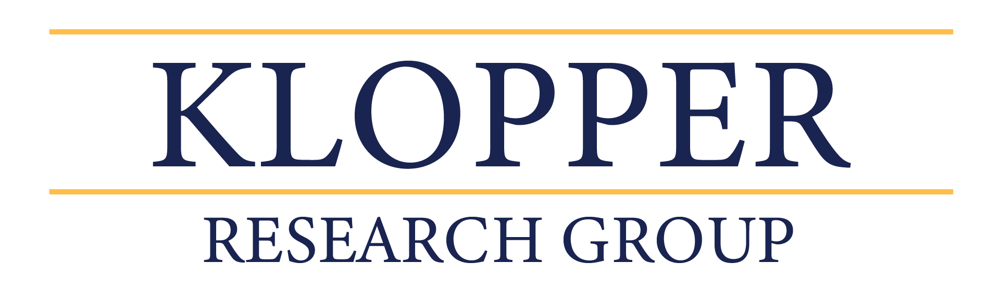

In [62]:
Image('KRG logo light.png',
     width = 1200)

# Describing populations

## Introduction

* Set of all unique data point values for a variable in a population is the __sample space__ of the variable in the population
* The data point values in the sample space are spread accroding to a __distribution__
  * There is a pattern to how likely each data point value is to be selected at random
  * This likelihood of being selected at random is the __probability__ of being selected
  * For a finite, discrete sample space, each individual unique data point value has its own porbability of being selected at random
  * For continuous variable, the probability is only defined on a range of values, i.e between $a,b \in \mathbb{R}$ or $[ a, \infty ) \in \mathbb{R}$

## Library import

In [0]:
import numpy as np
from scipy import stats
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go


In [0]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

## Bernoulli distribution

* Simple distribution for a binary (discrete) outcome, i.e. $0$ or $1$
* Unique binary data point values often used to represent _success_ and _failure_
* Succession of trials termed __Bernoulli trials__
* Bernoulli variable has $\mu = p$ and $\sigma^2 = p \left( 1 - p \right)$, where _p_ is the probability of randomly selecting $1$

In [65]:
# Ten Bernoulli trials with a probability of success being 0.5
np.random.seed(1)
stats.bernoulli.rvs(0.5,
                    size = 10)

array([0, 1, 0, 0, 0, 0, 0, 0, 0, 1])

## Binomial distribution

* Simple distribution for discrete variables
* Counts the number of _successes_ in _n_ Bernoulli trials
* Binomial distribution has $\mu = np$ and $\sigma^2 = \sqrt{np \left( 1- p \right)}$
* Example below shows $100$ patients receiving a drug that has a particlar side-effect probability of $20$%
* This experiment of giving the drug to $100$ patients is repeated $500$ times
  * The result show the number of patients suffering the side-effect (only first $20$ trials shown)

In [66]:
# Five hundred trials of 100 patients each
np.random.seed(1)
trials = stats.binom.rvs(100,
                         0.2,
                         size = 500)

# Showing first 20 trials
trials[1:20]

array([22,  7, 18, 16, 15, 16, 18, 19, 20, 19, 22, 17, 25, 13, 22, 19, 20,
       16, 17])

* Histogram below shows the number of complications

In [67]:
# Required code to run plotly in a cell
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# Plot
trace0 = go.Histogram(x = trials,
                     xbins = {"start":np.min(trials),
                             "end":np.max(trials),
                             "size":1})
data = [trace0]
layout = {"title":"Number of complications",
         "xaxis":{"title":"Number of complications",
                 "zeroline":False},
         "yaxis":{"title":"Count",
                 "zeroline":False}}
iplot({"data":data,
      "layout":layout})

## Normal distribution

* Most used continuous distribution
* Bell-shaped distribution
* Standard normal distribution has $\mu = 0$ and $\sigma^2 = 1$
* Probability density function is given in equation (1)

$$ f \left( x | \mu , \sigma \right) = \frac{e^{\frac{-{\left( x - \mu \right)}^{2}}{2 \sigma^2}}}{\sqrt{2 \pi \sigma^2}} \tag{1} $$

* Example below draws $1000$ random sample from a normal distribution with $\mu = 15$ and $\sigma = 3$ 

In [0]:
# One thousand data point values from a normal distribution
np.random.seed(1)
nrm = stats.norm.rvs(loc = 15,
                    scale = 3,
                    size = 1000)

* Below is a histogram of the $1000$ values

In [69]:
# Required code to run plotly in a cell
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# Plot
trace0 = go.Histogram(x = nrm,
                     xbins = {"start":np.min(nrm),
                             "end":np.max(nrm),
                             "size":1})
data = [trace0]
layout = {"title":"Histogram",
         "xaxis":{"title":"Value of <i>nrm</i>",
                 "zeroline":False},
         "yaxis":{"title":"Count",
                 "zeroline":False}}
iplot({"data":data,
      "layout":layout})

* Calculating the probability of certain ranges in this random dataset
  * Reminder: a continuous variable has no probability for a single value
  * The cumulative distribution function calculates the area under the curve (the _p_ value) from the $- \infty$ side of the _x_ axis
    * For a value up until a certain point use `stats.norm.cdf()`
    * For a value larger than a certain point use `1 - stats.norm.cdf()`
    * For the probability of a value between two points, subtract the _cdf_ of the smalller point from the larger point

In [70]:
# Probability of a value less than 10
stats.norm.cdf(10,
              loc = var.mean(),
              scale = var.std())

0.054082686101364255

In [71]:
# Probability of a value of more than 20
1 - stats.norm.cdf(20,
                  loc = np.mean(var), # Using np.mean
                  scale = var.std()) # Using an attribute of the var array

0.052897340216695565

In [72]:
# Probability of a value between 10 and 20
stats.norm.cdf(20,
              loc = var.mean(),
              scale = var.std()) - stats.norm.cdf(10,
                                                 loc = var.mean(),
                                                 scale = var.std())

0.8930199736819402

## Uniform distribution

* The uniform distribution has an equal probability for the random selection of any value (discrete) or range of values (continuous)
* For lower and upper limits of $\left( a,b \right)$ it has a mean and a standard deviation given in equation (2)

$$ \mu = \frac{a+b}{2} \\ \sigma = \frac{{\left( b - a \right)}^{2}}{12} \tag{2}$$

* Equation (3) shows the derivation of the values $a$ and $b$ given the $\mu$ and $\sigma$

$$ 2 \left(100 \right) = a + b \\ a = 200 - b \\ b - a = \sqrt{120} \\ b = \sqrt{120} + 200 -b \\ 2b = \sqrt{120} + 200 \\ b \approx 105.5 \\ a \approx 94.5    \tag{3} $$

* Selecting $1000$ values at random from a uniform distribution with $\mu = 100$ and $\sigma = 10$

In [0]:
# One thousand random values from a uniform distribution
np.random.seed(1)
uni = stats.uniform.rvs(loc = 100,
                        scale = 10,
                        size = 1000)

* Plot of the distribution for `uni`

In [74]:
# Required code to run plotly in a cell
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# Plot
trace0 = go.Histogram(x = uni,
                     xbins = {"start":np.min(uni),
                             "end":np.max(uni),
                             "size":1})
data = [trace0]
layout = {"title":"Histogram",
         "xaxis":{"title":"Value of <i>uni</i>",
                 "zeroline":False},
         "yaxis":{"title":"Count",
                 "zeroline":False}}
iplot({"data":data,
      "layout":layout})

## Exponential distribution

* A skewed distribution
* Valuable for modeling populations that decline over time
* For a given $\lambda$, the probability density function, $\mu$ and $\sigma$ are given in equation 4

$$ f \left( x | \lambda \right) = \lambda e^{- \lambda x} \\ \mu = \frac{1}{\lambda} \\ \sigma = \frac{1}{\lambda} \tag{4}$$

* Creating $1000$ random data point values from an exponential distribution

In [0]:
# One thousand random data point values from an exponential distribution
np.random.seed(1)
expo = stats.expon.rvs(size = 1000)

* Plotting the random data point values for `var3`

In [76]:
# Required code to run plotly in a cell
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# Plot
trace0 = go.Histogram(x = expo,
                     xbins = {"start":np.min(expo),
                             "end":np.max(var3),
                             "size":1})
data = [trace0]
layout = {"title":"Histogram",
         "xaxis":{"title":"Value of <i>expo</i>",
                 "zeroline":False},
         "yaxis":{"title":"Count",
                 "zeroline":False}}
iplot({"data":data,
      "layout":layout})

## Central limit theorem

* Given a large enough repeated sampling from a population, the distribution of means of all the repeated samples approaches a normal distribution
* Below $30$ samples are taken at random from the `uni` variable (with replacement)
  * This is repeated $10,000$  times and each time the mean of the $30$ values is recorded

In [0]:
means = []
np.random.seed(1)

for i in range(10000):
    sample = np.random.choice(uni,size = 30,replace = True)
    means.append(sample.mean())

* A histogram of the distribution of means show its _normal_ shape

In [78]:
# Required code to run plotly in a cell
configure_plotly_browser_state()
init_notebook_mode(connected=False)

# Plot
trace0 = go.Histogram(x = means)
data = [trace0]
layout = {"title":"Histogram of sampling means",
         "xaxis":{"title":"Sampling means",
                 "zeroline":False},
         "yaxis":{"title":"Count",
                 "zeroline":False}}
iplot({"data":data,
      "layout":layout})